In [ ]:
import os
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams, cycler
from matplotlib.cm import ScalarMappable
import sys
sys.path.append(os.path.join('c:\\', *os.getcwd().split('\\')[1:-1]))
from sgcc import *

In [2]:
plt.rcParams['figure.dpi'] = 300
fontsize = 8
linewidth = 0.5

In [3]:
X = tf.convert_to_tensor(np.arange(0.02,0.34,0.02), dtype = tf.float32)

In [4]:
## load the data
ringach_resp_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'project_datafiles', 'ringach_resp.pkl')
ringach_resp = pd.read_pickle(ringach_resp_file)
Y_true = ringach_resp.mean((0,2)).transpose(1,0,2)

In [5]:
# set the parameter bounds
param_bounds = {
    "fts": [-200, 200],
    "t": [40, 150],
    "ampc": [0.01, 0.1],
    'ampm': [0,3],
    "ampg": [0.1, 4],
    "ampw": [0.01,0.1],
    "d": [10, 40],
    "inh_d": [0, 40],
    "inh_w": [0, 3],
}

In [6]:
model = SGCCircuit(param_bounds, T = 500)

In [7]:
optimized_model_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'project_datafiles', 'joint_exp_fit.pkl')
with open(optimized_model_file, 'rb') as f:
    model_state = pickle.load(f)

In [8]:
model.load_saved_parameters(model_state['final_epoch_params'])

In [9]:
R = model.predict(X)

In [10]:
param_history = model_state['param_history']

In [11]:
loss_decay = model_state['loss_decay']
last_epoch = loss_decay[-1]
best = np.where(last_epoch == last_epoch.min())[0][0]
print(f"Index of best parameters: {best}, loss = {last_epoch[best]}")

Index of best parameters: 12, loss = 0.0013113021850585938


In [12]:
x = np.arange(0.01,0.32,0.005)
y = (1/x)/(1/x).max()
lowpass_y = (1/x)/(1/x).max()
highpass_y = (1/x)/(1/x).max()
lowpass_y[[np.where(x>=0.08)]] = 0
highpass_y[[np.where(x<0.08)]] = 0

meanx_lowpass = np.sum(x*lowpass_y)/np.sum(lowpass_y)
meanx = np.sum(x*y)/np.sum(y)
meanx_highpass = np.sum(x*highpass_y)/np.sum(highpass_y)

In [13]:
# lowpass_y = np.exp(-x*10)
# highpass_y = np.exp(-x*10)
# lowpass_y[[np.where(x>=0.1)]] = 0
# highpass_y[[np.where(x<0.1)]] = 0

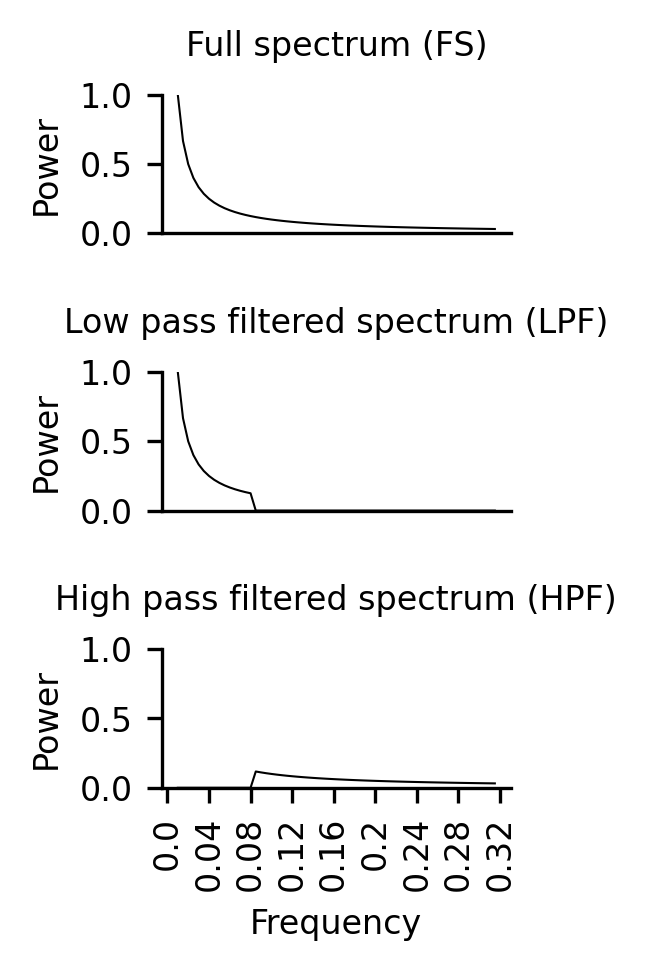

In [14]:
fig, ax = plt.subplots(3, figsize = (1.5,3))


titles = [
    'Full spectrum (FS)',
    'Low pass filtered spectrum (LPF)',
    'High pass filtered spectrum (HPF)'
]
for i in range(3):
    ax[i].tick_params(labelsize = fontsize)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['right'].set_visible(False)
    ax[i].set_ylabel("Power", fontsize = fontsize)
    ax[i].set_ylim(0,1)
    ax[i].set_title(titles[i], fontsize = fontsize, y = 1.1)
    if i<2:
        ax[i].set_xticks([])

ax[0].plot(x, y, linewidth = linewidth, color = 'black')
ax[2].set_xticks(np.arange(0,0.36,0.04))
ax[2].set_xticklabels(np.arange(0,0.36,0.04), fontsize = fontsize, rotation = 90)
ax[1].plot(x, lowpass_y, linewidth = linewidth, color = 'black')
ax[2].plot(x, highpass_y, linewidth = linewidth, color = 'black')

ax[2].set_xlabel("Frequency", fontsize = fontsize)
fig.subplots_adjust(hspace=1)

figname = 'filter_cond_schematic.svg'
savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
plt.savefig(savepath, transparent = False, facecolor = 'white',
           bbox_inches = 'tight', dpi = 300)

In [15]:
Rfull = model.predict(tf.convert_to_tensor(x, dtype=tf.float32))

In [16]:
NI = Rfull * tf.reshape(tf.convert_to_tensor(y, dtype = tf.float32), [1,1,-1,1])
LP = Rfull * tf.reshape(tf.convert_to_tensor(lowpass_y, dtype = tf.float32), [1,1,-1,1])
HP = Rfull * tf.reshape(tf.convert_to_tensor(highpass_y, dtype = tf.float32), [1,1,-1,1])

In [17]:
Xm = tf.convert_to_tensor([meanx_lowpass, meanx, meanx_highpass], dtype=tf.float32)

In [18]:
Rm = model.predict(Xm) 

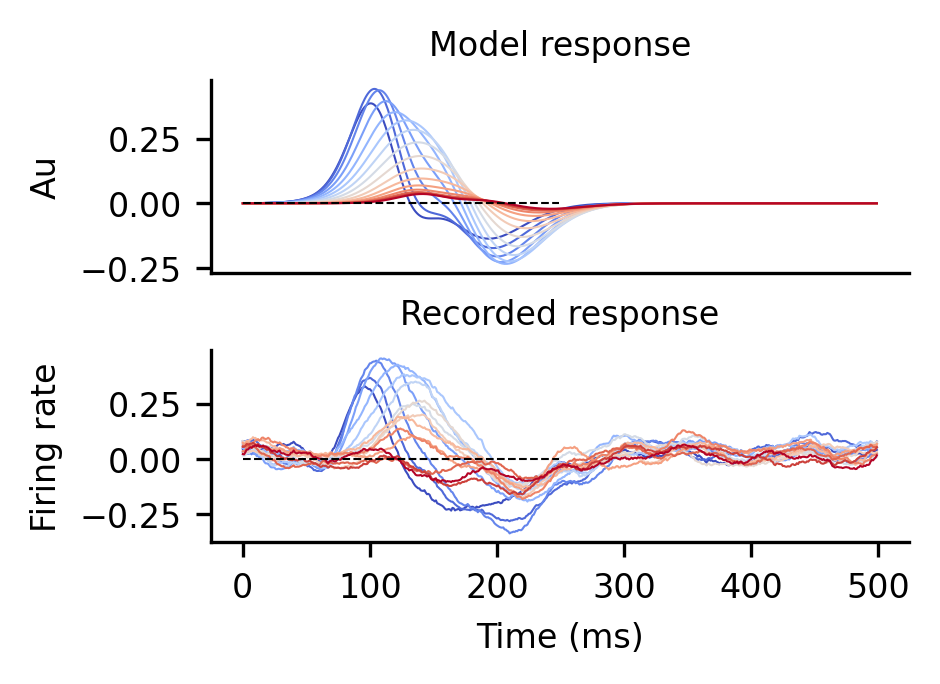

In [19]:
# neurons x SF x time steps

cmap = plt.get_cmap('coolwarm') 
rcParams['axes.prop_cycle'] = cycler(color=cmap(np.linspace(0, 1, 16)))

n = 0

fig, ax = plt.subplots(2, figsize = (3,2))
ax[0].plot(R[best].numpy()[n].T, linewidth = linewidth)
ax[0].set_title("Model response", fontsize = fontsize)
ax[0].set_xticks([])

ax[1].plot(Y_true[n].T, linewidth = linewidth)
ax[1].set_title('Recorded response', fontsize = fontsize)
for i in range(2):
    ax[i].plot(np.zeros(250), '--', color = 'black', linewidth = linewidth)
    ax[i].tick_params(labelsize = fontsize)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['right'].set_visible(False)

ax[0].set_ylabel("Au", fontsize = fontsize)
ax[1].set_ylabel("Firing rate", fontsize = fontsize)
ax[1].set_xlabel("Time (ms)", fontsize = fontsize)

fig.subplots_adjust(hspace=0.4)

In [20]:
ni_resp = pd.read_pickle(os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'project_datafiles', 'ni_resp.pkl'))

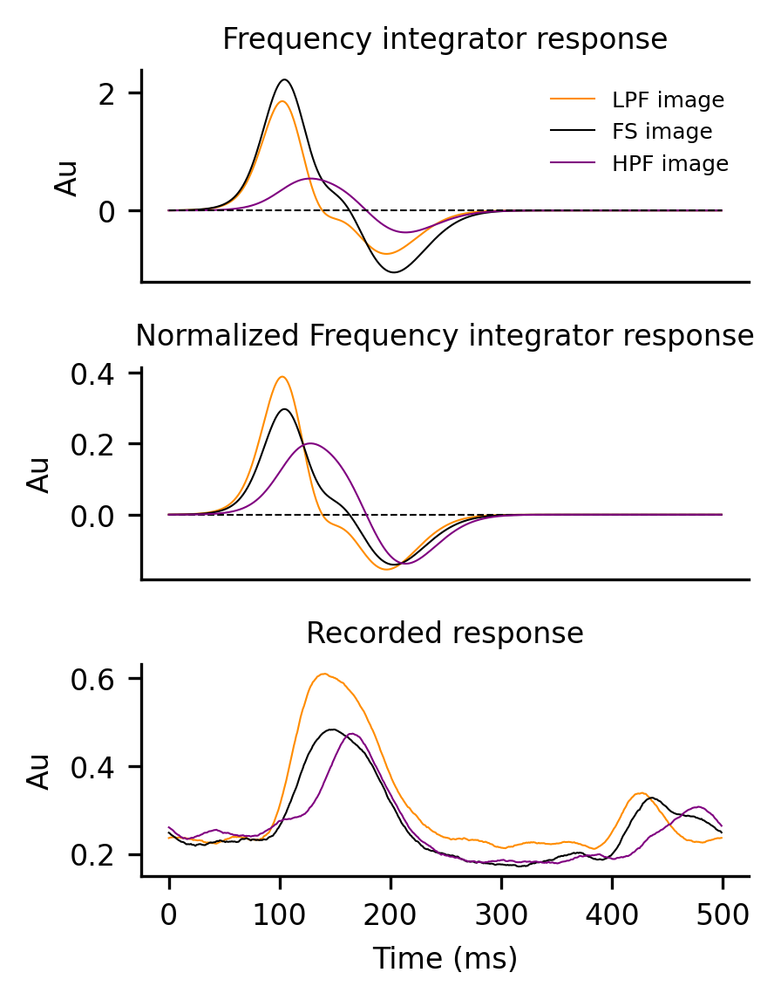

In [21]:
# neurons x SF x time steps

fig, ax = plt.subplots(3, figsize = (3,4))

ax[0].plot(tf.reduce_sum(LP[best,n], axis=0), color = 'darkorange', label = 'LPF image', linewidth = linewidth)
ax[0].plot(tf.reduce_sum(NI[best,n], axis=0), color = 'black', label = 'FS image', linewidth = linewidth)
ax[0].plot(tf.reduce_sum(HP[best,n], axis=0), color = 'purple', label = 'HPF image', linewidth = linewidth)
ax[0].plot(np.zeros(500), '--', color = 'black', linewidth = linewidth)
ax[0].set_title("Frequency integrator response", fontsize = fontsize)
ax[0].set_xticks([])

ax[1].plot(tf.reduce_sum(LP[best,n], axis=0)/lowpass_y.sum(), color = 'darkorange', label = 'LPF image', linewidth = linewidth)
ax[1].plot(tf.reduce_sum(NI[best,n], axis=0)/y.sum(), color = 'black', label = 'FS image', linewidth = linewidth)
ax[1].plot(np.zeros(500), '--', color = 'black', linewidth = linewidth)
ax[1].plot(tf.reduce_sum(HP[best,n], axis=0)/highpass_y.sum(), color = 'purple', label = 'HPF image', linewidth = linewidth)
ax[1].set_title("Normalized Frequency integrator response", fontsize = fontsize)
ax[1].set_xticks([])

ax[2].plot(ni_resp.mean(1)[1,n], linewidth = linewidth, color = 'darkorange', label = 'LPF Image')
ax[2].plot(ni_resp.mean(1)[2,n], linewidth = linewidth, color = 'black', label = 'FS Image')
ax[2].plot(ni_resp.mean(1)[0,n], linewidth = linewidth, color = 'purple', label = 'HPF Image')
ax[2].set_title('Recorded response', fontsize = fontsize)

ax[0].legend(fontsize = 6, loc = 'upper right', frameon = False)
for i in range(3):
    ax[i].set_ylabel("Au", fontsize = fontsize)
    ax[i].tick_params(labelsize = fontsize)
    ax[i].spines['top'].set_visible(False)
    ax[i].spines['right'].set_visible(False)

ax[2].set_xlabel("Time (ms)", fontsize = fontsize)

fig.subplots_adjust(hspace=0.4)

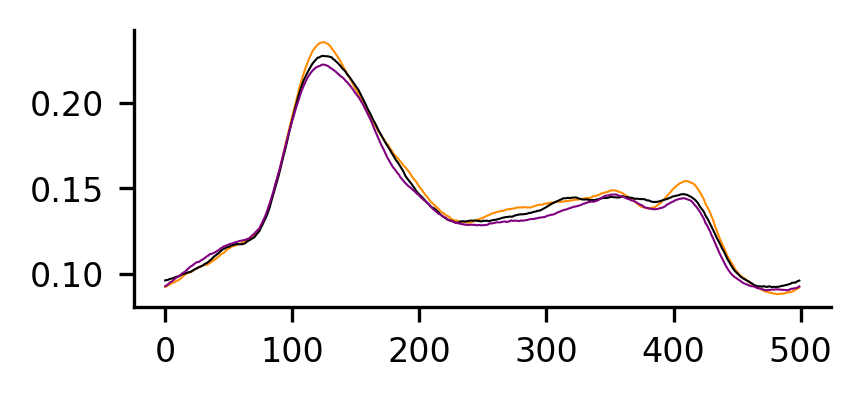

In [22]:
ni_resp.mean((1,2))

fig, ax = plt.subplots(figsize = (3,1.2))
ax.tick_params(labelsize = fontsize)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)


ax.plot(ni_resp.mean((1,2))[1], linewidth = linewidth, color = 'darkorange', label = 'LPF Image')
ax.plot(ni_resp.mean((1,2))[2], linewidth = linewidth, color = 'black', label = 'FS Image')
ax.plot(ni_resp.mean((1,2))[0], linewidth = linewidth, color = 'purple', label = 'HPF Image')

C:\Users\Sturdy\AppData\Local\Temp\ipykernel_57696\875391692.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(3, figsize = (3,4))


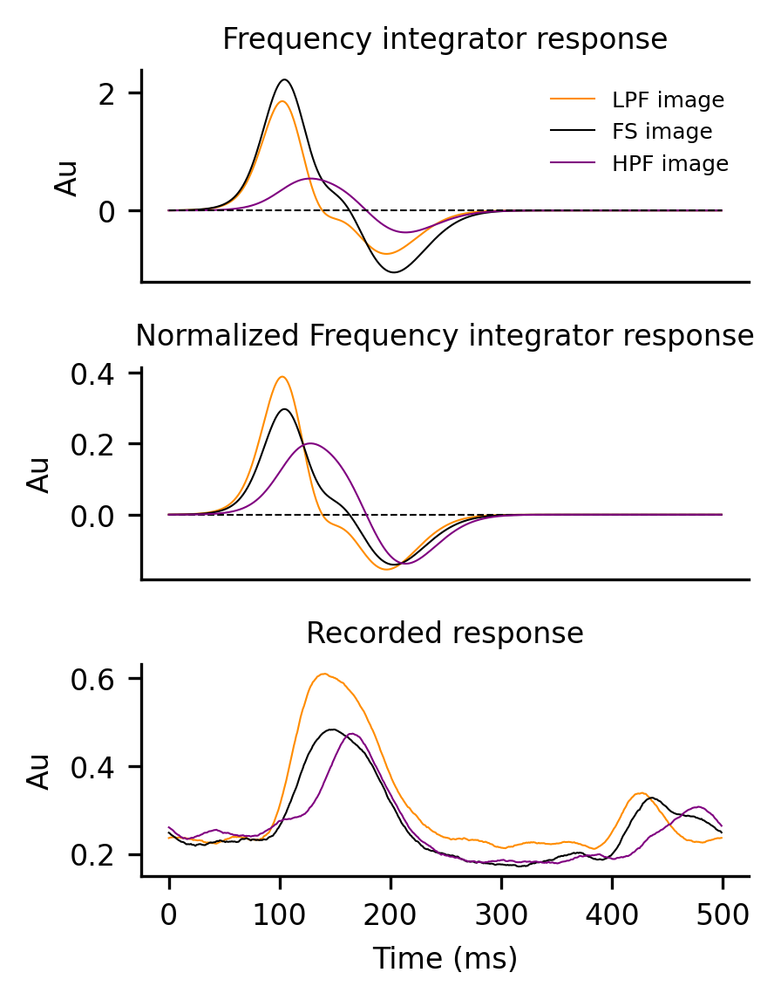

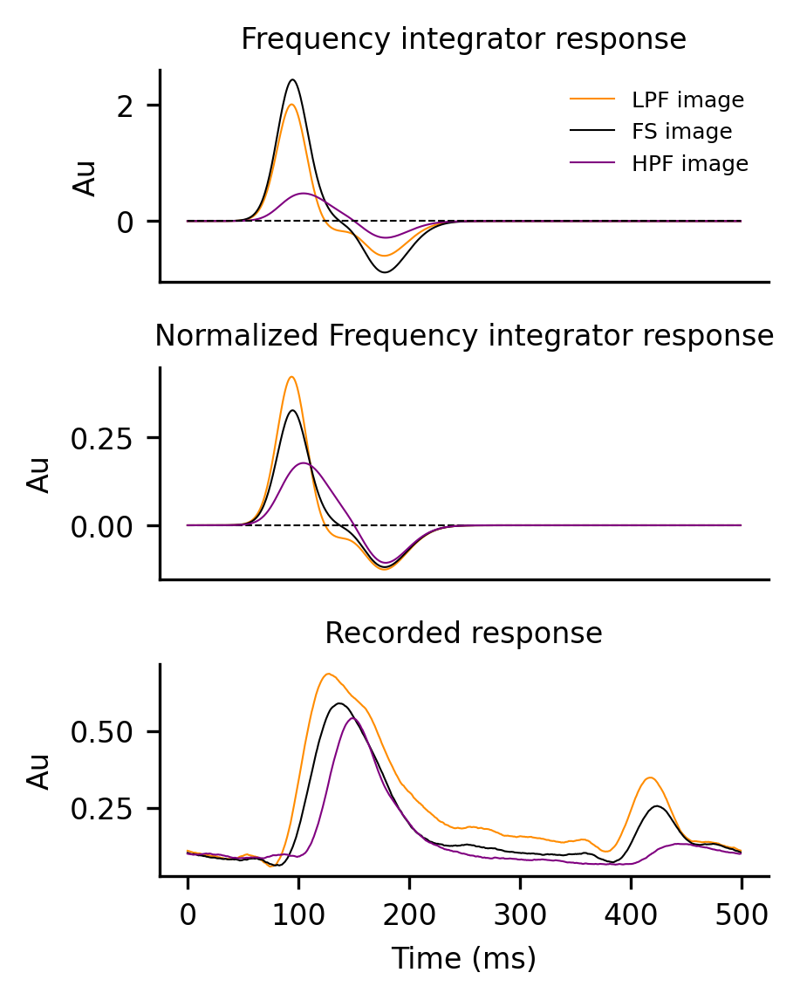

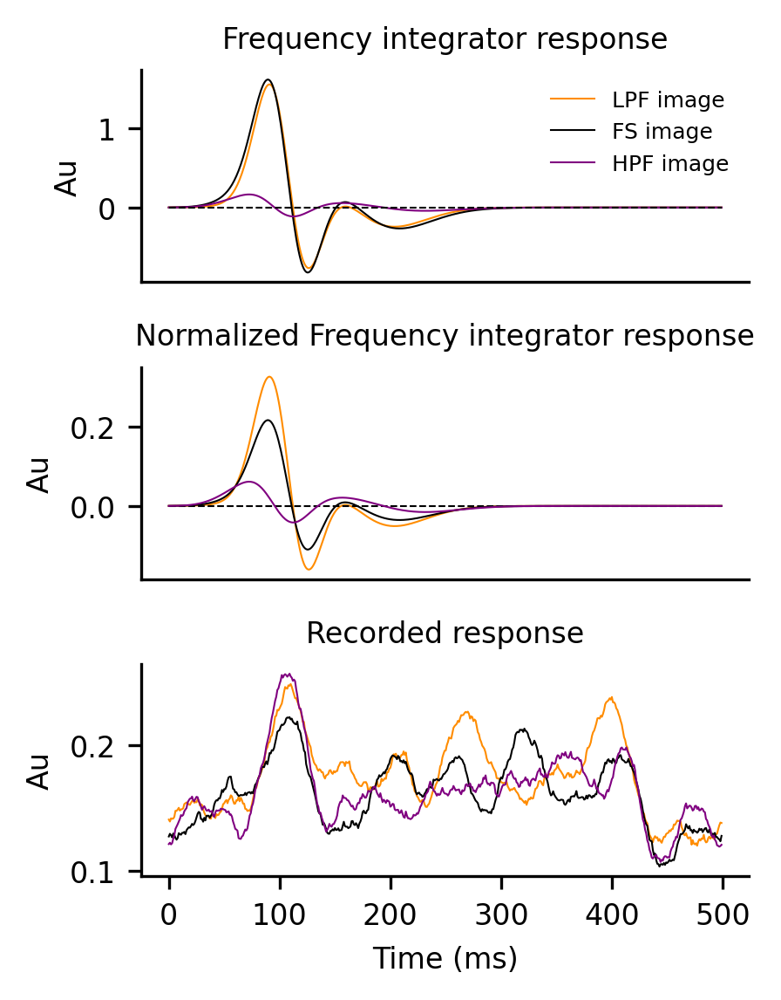

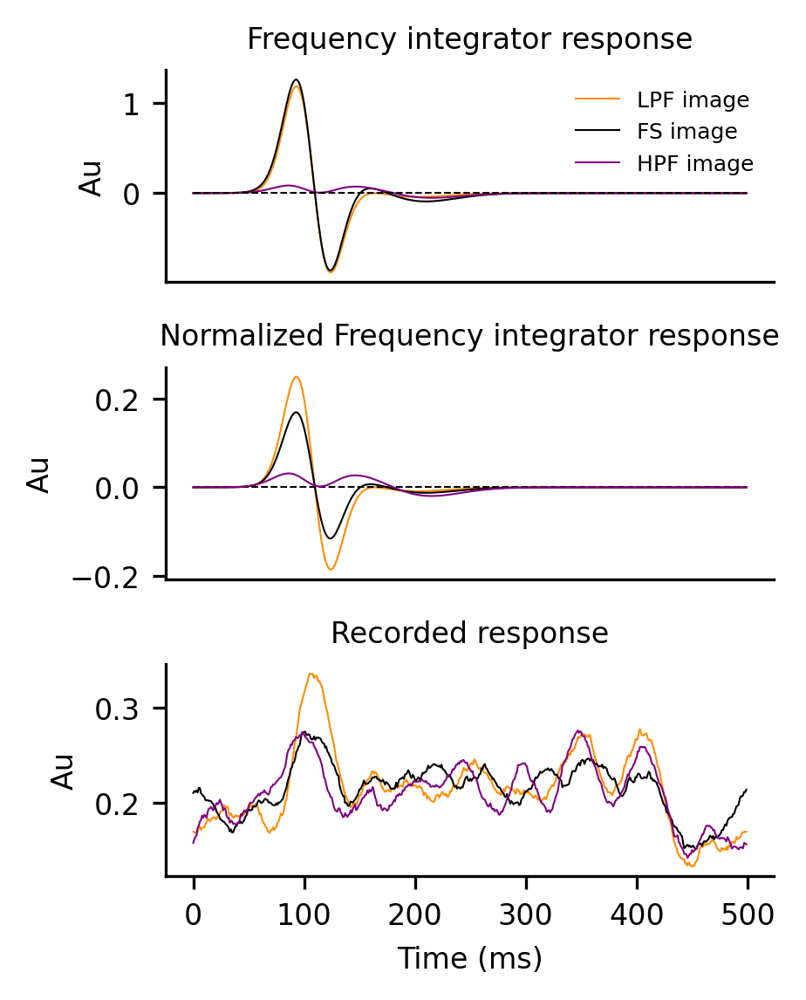

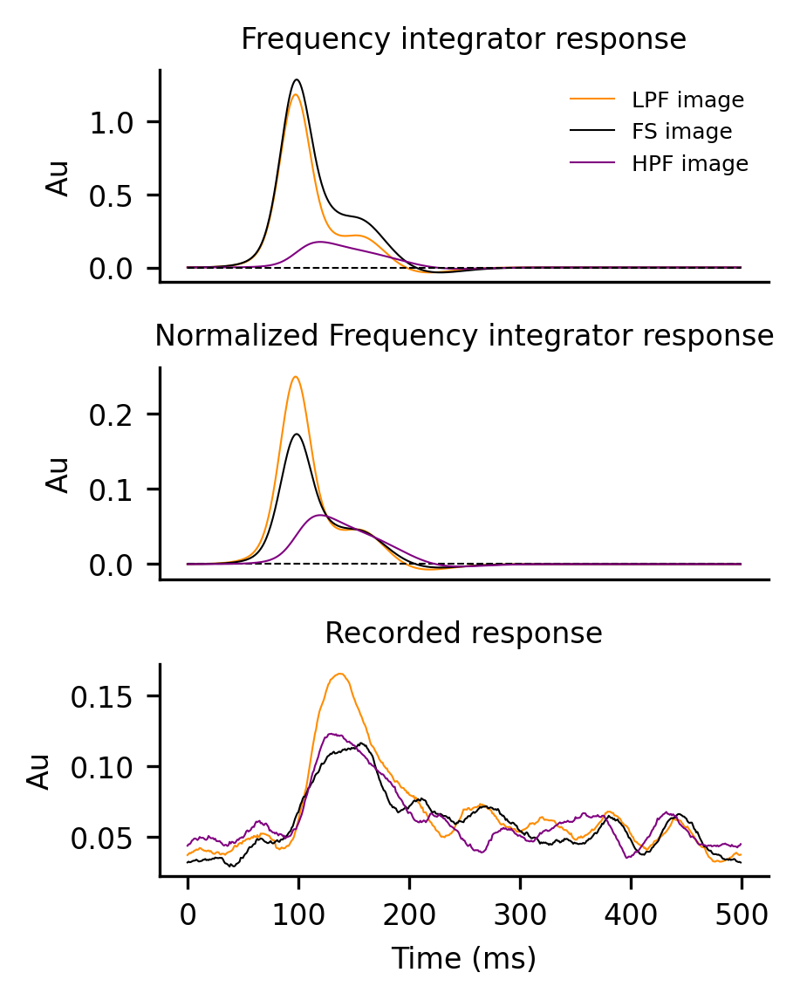

...

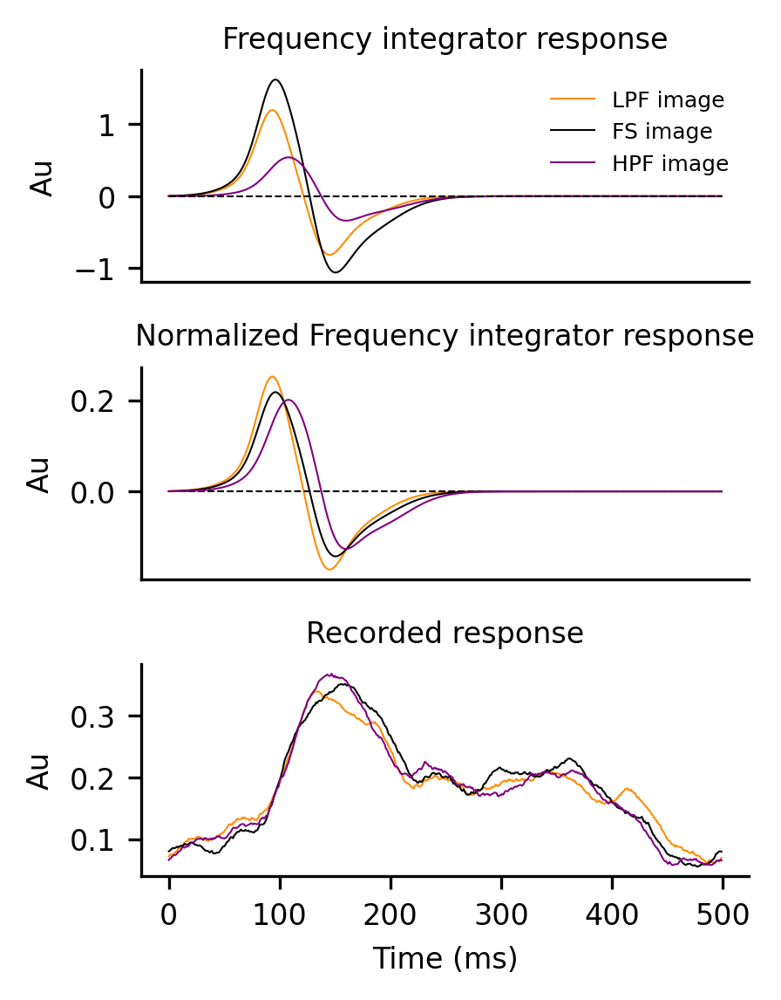

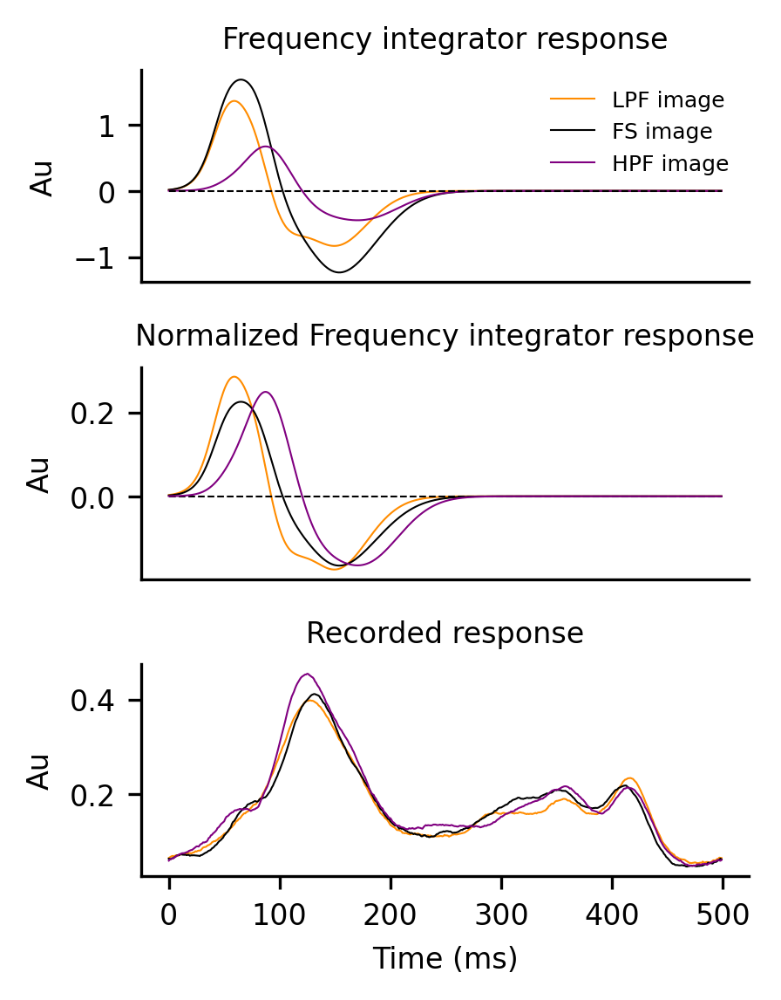

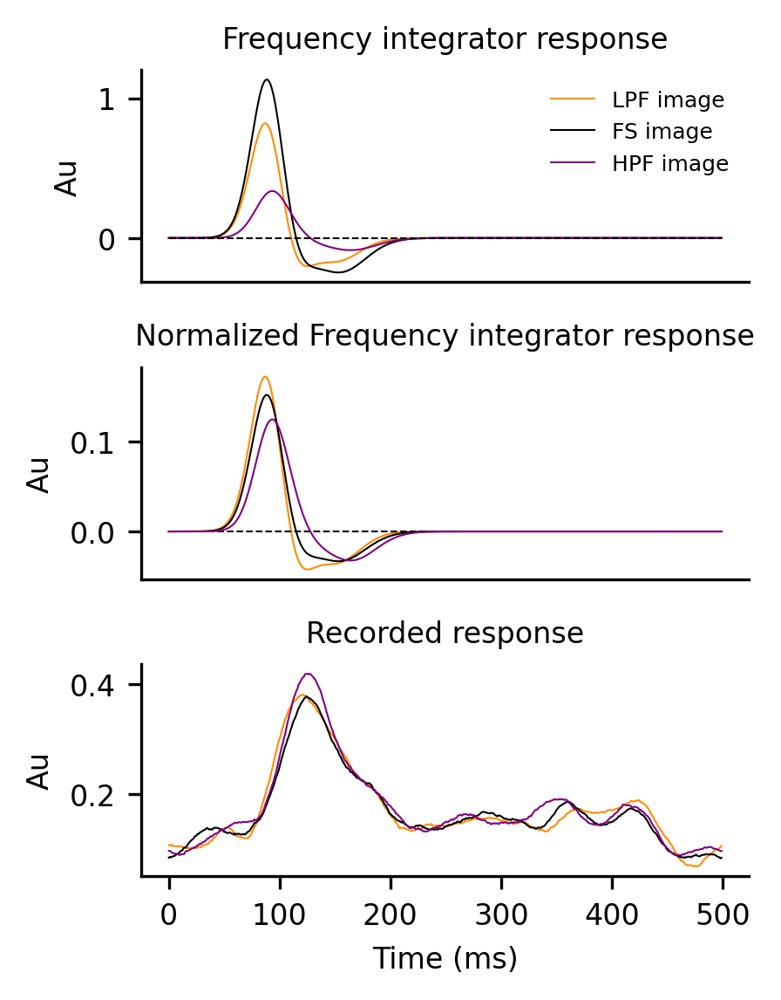

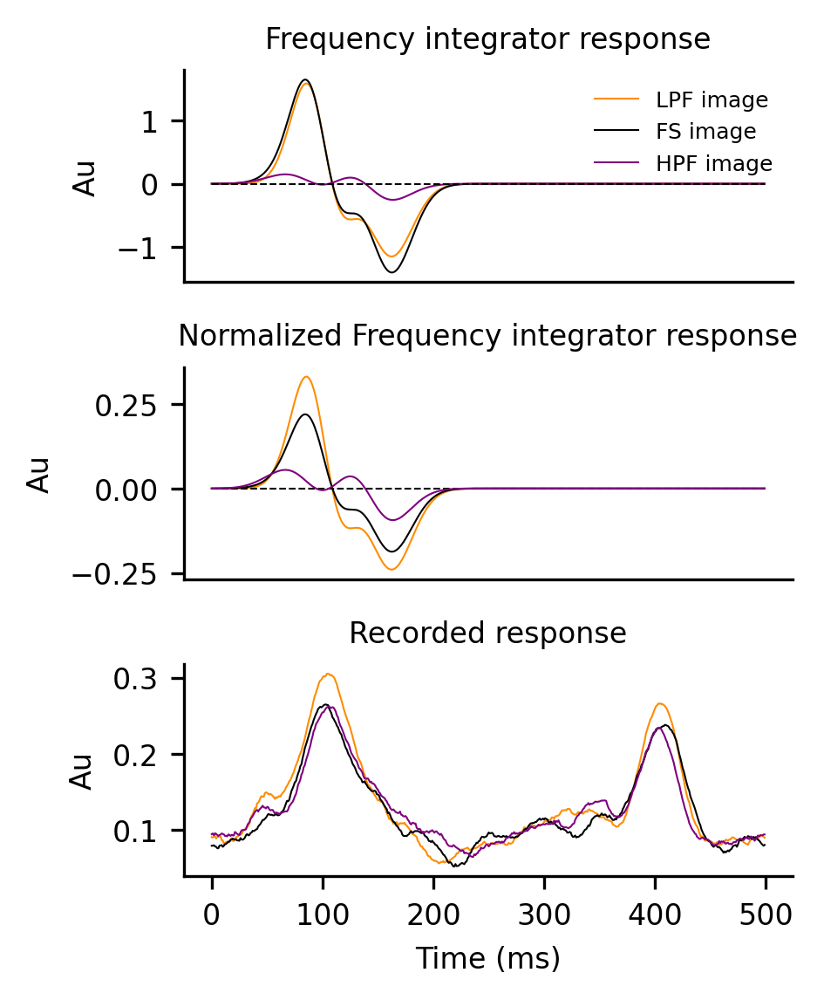

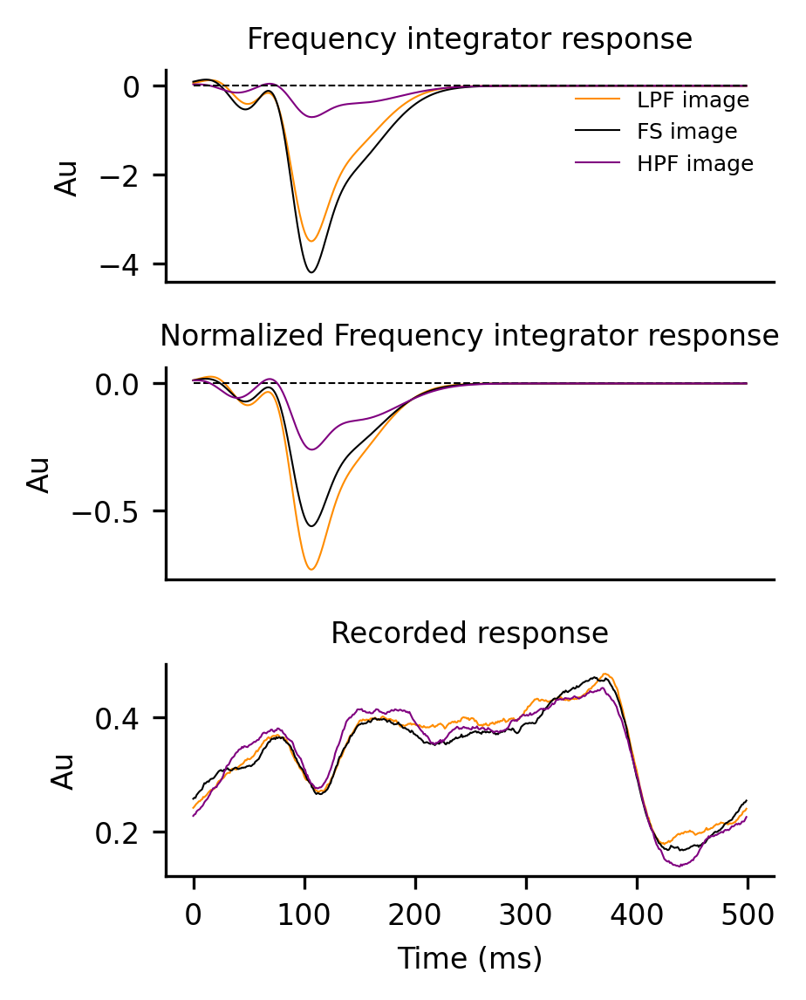

In [23]:
for n in range(64):

    fig, ax = plt.subplots(3, figsize = (3,4))

    ax[0].plot(tf.reduce_sum(LP[best,n], axis=0), color = 'darkorange', label = 'LPF image', linewidth = linewidth)
    ax[0].plot(tf.reduce_sum(NI[best,n], axis=0), color = 'black', label = 'FS image', linewidth = linewidth)
    ax[0].plot(tf.reduce_sum(HP[best,n], axis=0), color = 'purple', label = 'HPF image', linewidth = linewidth)
    ax[0].plot(np.zeros(500), '--', color = 'black', linewidth = linewidth)
    ax[0].set_title("Frequency integrator response", fontsize = fontsize)
    ax[0].set_xticks([])

    ax[1].plot(tf.reduce_sum(LP[best,n], axis=0)/lowpass_y.sum(), color = 'darkorange', label = 'LPF image', linewidth = linewidth)
    ax[1].plot(tf.reduce_sum(NI[best,n], axis=0)/y.sum(), color = 'black', label = 'FS image', linewidth = linewidth)
    ax[1].plot(np.zeros(500), '--', color = 'black', linewidth = linewidth)
    ax[1].plot(tf.reduce_sum(HP[best,n], axis=0)/highpass_y.sum(), color = 'purple', label = 'HPF image', linewidth = linewidth)
    ax[1].set_title("Normalized Frequency integrator response", fontsize = fontsize)
    ax[1].set_xticks([])

    ax[2].plot(ni_resp.mean(1)[1,n], linewidth = linewidth, color = 'darkorange', label = 'LPF Image')
    ax[2].plot(ni_resp.mean(1)[2,n], linewidth = linewidth, color = 'black', label = 'FS Image')
    ax[2].plot(ni_resp.mean(1)[0,n], linewidth = linewidth, color = 'purple', label = 'HPF Image')
    ax[2].set_title('Recorded response', fontsize = fontsize)

    ax[0].legend(fontsize = 6, loc = 'upper right', frameon = False)
    for i in range(3):
        ax[i].set_ylabel("Au", fontsize = fontsize)
        ax[i].tick_params(labelsize = fontsize)
        ax[i].spines['top'].set_visible(False)
        ax[i].spines['right'].set_visible(False)

    ax[2].set_xlabel("Time (ms)", fontsize = fontsize)

    fig.subplots_adjust(hspace=0.4)

    # figname = f'ni_predicted_resp_{n}.svg'
    # savepath = v1_xs_file = os.path.join('c:\\', *os.getcwd().split('\\')[1:-1], 'figures', figname)
    # plt.savefig(savepath, transparent = False, facecolor = 'white',
    #         bbox_inches = 'tight', dpi = 300)